# Importing dataframes from https://data.world/dataman-udit/us-regional-sales-data

In [1]:
# Importing libraries
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import scipy
from pandas_profiling import ProfileReport
import tkinter
from tkinter import *
from tkinter import ttk
import missingno as msno
import matplotlib
from matplotlib import style

style.use("ggplot")
from sklearn import svm
pd.options.display.float_format = '{:.2f}'.format

In [2]:
#02 IMPORTING DATA

path = r'C:\Users\Martin ARAUJO\Documents\US Regional Sales Data'
Sales_Orders = pd.read_excel(os.path.join(path, '02- Data', 'Original data', 'US_Regional_Sales_Data.xlsx'), sheet_name= 'Sales_Orders_Sheet')

In [3]:
#02 IMPORTING DATA

path = r'C:\Users\Martin ARAUJO\Documents\US Regional Sales Data'
Customers_Sheet = pd.read_excel(os.path.join(path, '02- Data', 'Original data', 'US_Regional_Sales_Data.xlsx'), sheet_name= 'Customers_Sheet')

In [4]:
#02 IMPORTING DATA

path = r'C:\Users\Martin ARAUJO\Documents\US Regional Sales Data'
Store_Locations_Sheet = pd.read_excel(os.path.join(path, '02- Data', 'Original data', 'US_Regional_Sales_Data.xlsx'), sheet_name= 'Store_Locations_Sheet')

In [5]:
#02 IMPORTING DATA

path = r'C:\Users\Martin ARAUJO\Documents\US Regional Sales Data'
Products_Sheet = pd.read_excel(os.path.join(path, '02- Data', 'Original data', 'US_Regional_Sales_Data.xlsx'), sheet_name= 'Products_Sheet')

In [6]:
#02 IMPORTING DATA

path = r'C:\Users\Martin ARAUJO\Documents\US Regional Sales Data'
Regions_Sheet = pd.read_excel(os.path.join(path, '02- Data', 'Original data', 'US_Regional_Sales_Data.xlsx'), sheet_name= 'Regions_Sheet')

In [7]:
#02 IMPORTING DATA

path = r'C:\Users\Martin ARAUJO\Documents\US Regional Sales Data'
Sales_Team_Sheet = pd.read_excel(os.path.join(path, '02- Data', 'Original data', 'US_Regional_Sales_Data.xlsx'), sheet_name= 'Sales_Team_Sheet')

# Visualization of the different dataframes

In [8]:
Sales_Orders.head(1)

,OrderNumber,Sales Channel,WarehouseCode,ProcuredDate,OrderDate,ShipDate,DeliveryDate,CurrencyCode,_SalesTeamID,_CustomerID,_StoreID,_ProductID,Order Quantity,Discount Applied,Unit Price,Unit Cost
0,SO - 000101,In-Store,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-14,2018-06-19,USD,6,15,259,12,5,0.07,1963.10,1001.18


In [9]:
Customers_Sheet.head(5)

,_CustomerID,Customer Names
0,1,Avon Corp
1,2,WakeFern
2,3,"Elorac, Corp"
3,4,ETUDE Ltd
4,5,Procter Corp


In [10]:
Store_Locations_Sheet.head(5)

,_StoreID,City Name,County,StateCode,State,Type,Latitude,Longitude,AreaCode,Population,Household Income,Median Income,Land Area,Water Area,Time Zone
0,1,Birmingham,Shelby County/Jefferson County,AL,Alabama,City,33.53,-86.80,205,212461,89972,31061,378353942,6591013,America/Chicago
1,2,Huntsville,Limestone County/Madison County,AL,Alabama,City,34.70,-86.67,256,190582,78554,48775,552604579,3452021,America/Chicago
2,3,Mobile,Mobile County,AL,Alabama,City,30.69,-88.04,251,194288,76170,38776,361044263,105325210,America/Chicago
3,4,Montgomery,Montgomery County,AL,Alabama,City,32.37,-86.30,334,200602,79866,42927,413985435,4411954,America/Chicago
4,5,Little Rock,Pulaski County,AR,Arkansas,City,34.75,-92.29,501,197992,79902,46085,307398785,6758644,America/Chicago


In [11]:
Products_Sheet.head(5)

,_ProductID,Product Name
0,1,Cookware
1,2,Photo Frames
2,3,Table Lamps
3,4,Serveware
4,5,Bathroom Furniture


In [12]:
Regions_Sheet.head(5)

,StateCode,State,Region
0,AL,Alabama,South
1,AR,Arkansas,South
2,AZ,Arizona,West
3,CA,California,West
4,CO,Colorado,West


In [13]:
Sales_Team_Sheet.head(5)

,_SalesTeamID,Sales Team,Region
0,1,Adam Hernandez,Northeast
1,2,Keith Griffin,Northeast
2,3,Jerry Green,West
3,4,Chris Armstrong,Northeast
4,5,Stephen Payne,South


# Merging datasets

In [14]:
#MERGING DATA Sales_Orders with Customers_Sheet
df_merged_1 = Sales_Orders.merge(Customers_Sheet, on = ['_CustomerID'], indicator = True)

In [15]:
df_merged_1.head(1)

,OrderNumber,Sales Channel,WarehouseCode,ProcuredDate,OrderDate,ShipDate,DeliveryDate,CurrencyCode,_SalesTeamID,_CustomerID,_StoreID,_ProductID,Order Quantity,Discount Applied,Unit Price,Unit Cost,Customer Names,_merge
0,SO - 000101,In-Store,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-14,2018-06-19,USD,6,15,259,12,5,0.07,1963.10,1001.18,Rochester Ltd,both


In [16]:
df_merged_1 = df_merged_1.drop(columns = ['_merge'])

In [17]:
#MERGING DATA Sales_Orders,Customers_Sheet with Store_Locations_Sheet
df_merged_2 = df_merged_1.merge(Store_Locations_Sheet, on = ['_StoreID'], indicator = True)

In [18]:
df_merged_2.head(1)

,OrderNumber,Sales Channel,WarehouseCode,ProcuredDate,OrderDate,ShipDate,DeliveryDate,CurrencyCode,_SalesTeamID,_CustomerID,...,Latitude,Longitude,AreaCode,Population,Household Income,Median Income,Land Area,Water Area,Time Zone,_merge
0,SO - 000101,In-Store,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-14,2018-06-19,USD,6,15,...,40.64,-73.32,631,213776,68789,80327,135481314,160302131,America/New York,both


In [19]:
# Display of all columns in the dataset
pd.set_option('display.max_columns', None)

In [20]:
df_merged_2 = df_merged_2.drop(columns = ['_merge'])

In [21]:
#MERGING DATA Sales_Orders,Customers_Sheet, Store_Locations_Sheet with Products_Sheet

In [22]:
df_merged_3 = df_merged_2.merge(Products_Sheet, on = ['_ProductID'], indicator = True)

In [23]:
df_merged_3.head(1)

,OrderNumber,Sales Channel,WarehouseCode,ProcuredDate,OrderDate,ShipDate,DeliveryDate,CurrencyCode,_SalesTeamID,_CustomerID,_StoreID,_ProductID,Order Quantity,Discount Applied,Unit Price,Unit Cost,Customer Names,City Name,County,StateCode,State,Type,Latitude,Longitude,AreaCode,Population,Household Income,Median Income,Land Area,Water Area,Time Zone,Product Name,_merge
0,SO - 000101,In-Store,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-14,2018-06-19,USD,6,15,259,12,5,0.07,1963.10,1001.18,Rochester Ltd,Babylon (Town),Suffolk County,NY,New York,Town,40.64,-73.32,631,213776,68789,80327,135481314,160302131,America/New York,Dining Furniture,both


In [24]:
df_merged_3 = df_merged_3.drop(columns = ['_merge'])

In [25]:
#MERGING DATA Sales_Orders,Customers_Sheet, Store_Locations_Sheet, Products_Sheet with Regions_Sheet

In [26]:
df_merged_4 = df_merged_3.merge(Regions_Sheet, on = ['StateCode'], indicator = True)

In [27]:
df_merged_4.head(1)

,OrderNumber,Sales Channel,WarehouseCode,ProcuredDate,OrderDate,ShipDate,DeliveryDate,CurrencyCode,_SalesTeamID,_CustomerID,_StoreID,_ProductID,Order Quantity,Discount Applied,Unit Price,Unit Cost,Customer Names,City Name,County,StateCode,State_x,Type,Latitude,Longitude,AreaCode,Population,Household Income,Median Income,Land Area,Water Area,Time Zone,Product Name,State_y,Region,_merge
0,SO - 000101,In-Store,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-14,2018-06-19,USD,6,15,259,12,5,0.07,1963.10,1001.18,Rochester Ltd,Babylon (Town),Suffolk County,NY,New York,Town,40.64,-73.32,631,213776,68789,80327,135481314,160302131,America/New York,Dining Furniture,New York,Northeast,both


In [28]:
df_merged_4 = df_merged_4.drop(columns = ['_merge'])

In [29]:
# MERGING DATA Sales_Orders,Customers_Sheet, Store_Locations_Sheet, Products_Sheet, Regions_Sheet with Sales_Team_Sheet

In [30]:
df_merged_5 = df_merged_4.merge(Sales_Team_Sheet, on = ['_SalesTeamID'], indicator = True)

In [31]:
df_merged_5.head(1)

,OrderNumber,Sales Channel,WarehouseCode,ProcuredDate,OrderDate,ShipDate,DeliveryDate,CurrencyCode,_SalesTeamID,_CustomerID,_StoreID,_ProductID,Order Quantity,Discount Applied,Unit Price,Unit Cost,Customer Names,City Name,County,StateCode,State_x,Type,Latitude,Longitude,AreaCode,Population,Household Income,Median Income,Land Area,Water Area,Time Zone,Product Name,State_y,Region_x,Sales Team,Region_y,_merge
0,SO - 000101,In-Store,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-14,2018-06-19,USD,6,15,259,12,5,0.07,1963.10,1001.18,Rochester Ltd,Babylon (Town),Suffolk County,NY,New York,Town,40.64,-73.32,631,213776,68789,80327,135481314,160302131,America/New York,Dining Furniture,New York,Northeast,Joshua Bennett,Northeast,both


In [32]:
df_merged_5 = df_merged_5.drop(columns = ['_merge'])

# RENAMING COLUMNS

In [33]:
df_merged_5.rename(columns = {'Region_y' : 'Sales_Team_Region'}, inplace = True)

In [34]:
df_merged_5.rename(columns = {'City Name' : 'City_Name_Store_location'}, inplace = True)

In [35]:
df_merged_5.rename(columns = {'County' : 'County_Store_location'}, inplace = True)

In [36]:
df_merged_5.rename(columns = {'StateCode' : 'StateCode_Store_location'}, inplace = True)

In [37]:
df_merged_5.rename(columns = {'State_x' : 'State_x_Store_location'}, inplace = True)

In [38]:
df_merged_5.rename(columns = {'Type' : 'Type_Store_location'}, inplace = True)

In [39]:
df_merged_5.rename(columns = {'Latitude' : 'Latitude_Store_location'}, inplace = True)

In [40]:
df_merged_5.rename(columns = {'Longitude' : 'Longitude_Store_location'}, inplace = True)

In [41]:
df_merged_5.rename(columns = {'AreaCode' : 'AreaCode_Store_location'}, inplace = True)

In [42]:
df_merged_5.rename(columns = {'Median Income' : 'Median_Income_Store_location'}, inplace = True)

In [43]:
df_merged_5.rename(columns = {'Land Area' : 'Land_Area_Store_location'}, inplace = True)

In [44]:
df_merged_5.rename(columns = {'Water Area' : 'Water_Area_Store_location'}, inplace = True)

In [45]:
df_merged_5.rename(columns = {'Time Zone' : 'Time_Zone_Store_location'}, inplace = True)

In [46]:
df_merged_5.rename(columns = {'Population' : 'Population_Store_location'}, inplace = True)

In [47]:
df_merged_5.rename(columns = {'Household Income	' : 'Household_Income_Store_location'}, inplace = True)

In [48]:
df_merged_5.rename(columns = {'State_y' : 'State'}, inplace = True)

In [49]:
df_merged_5.rename(columns = {'Region_x' : 'Region'}, inplace = True)

# DROPPING COLUMNS


In [50]:
df_merged_5 = df_merged_5.drop(columns = ['_SalesTeamID'])

In [51]:
df_merged_5 = df_merged_5.drop(columns = ['_CustomerID'])

In [52]:
df_merged_5 = df_merged_5.drop(columns = ['_StoreID'])

In [53]:
df_merged_5 = df_merged_5.drop(columns = ['_ProductID'])

In [54]:
df_merged_5.head(5)

,OrderNumber,Sales Channel,WarehouseCode,ProcuredDate,OrderDate,ShipDate,DeliveryDate,CurrencyCode,Order Quantity,Discount Applied,Unit Price,Unit Cost,Customer Names,City_Name_Store_location,County_Store_location,StateCode_Store_location,State_x_Store_location,Type_Store_location,Latitude_Store_location,Longitude_Store_location,AreaCode_Store_location,Population_Store_location,Household Income,Median_Income_Store_location,Land_Area_Store_location,Water_Area_Store_location,Time_Zone_Store_location,Product Name,State,Region,Sales Team,Sales_Team_Region
0,SO - 000101,In-Store,WARE-UHY1004,2017-12-31,2018-05-31,2018-06-14,2018-06-19,USD,5,0.07,1963.10,1001.18,Rochester Ltd,Babylon (Town),Suffolk County,NY,New York,Town,40.64,-73.32,631,213776,68789,80327,135481314,160302131,America/New York,Dining Furniture,New York,Northeast,Joshua Bennett,Northeast
1,SO - 0005166,In-Store,WARE-PUJ1005,2019-08-23,2020-01-22,2020-01-28,2020-01-31,USD,5,0.05,1909.50,954.75,New Ltd,Buffalo,Erie County,NY,New York,City,42.89,-78.88,716,258071,110549,31918,104592941,31362925,America/New York,Dining Furniture,New York,Northeast,Joshua Bennett,Northeast
2,SO - 0006713,In-Store,WARE-UHY1004,2020-03-10,2020-07-21,2020-08-15,2020-08-16,USD,3,0.07,2492.40,1246.20,"Fenwal, Corp",Babylon (Town),Suffolk County,NY,New York,Town,40.64,-73.32,631,213776,68789,80327,135481314,160302131,America/New York,Computers,New York,Northeast,Joshua Bennett,Northeast
3,SO - 0006843,In-Store,WARE-PUJ1005,2020-03-10,2020-08-06,2020-08-14,2020-08-17,USD,3,0.10,3932.90,2084.44,OHTA'S Corp,Staten Island,Richmond County,NY,New York,Borough,40.58,-74.14,718,474558,156341,55039,152000000,110000000,America/New York,Basketball,New York,Northeast,Joshua Bennett,Northeast
4,SO - 0005035,In-Store,WARE-UHY1004,2019-08-23,2020-01-08,2020-01-15,2020-01-21,USD,3,0.15,1755.40,1299.00,Niconovum Corp,Babylon (Town),Suffolk County,NY,New York,Town,40.64,-73.32,631,213776,68789,80327,135481314,160302131,America/New York,Cookware,New York,Northeast,Joshua Bennett,Northeast


# FINDING DUPLICATES

In [55]:
# Finding Duplicates
df_merged_5_duplicates = df_merged_5[df_merged_5.duplicated()]

In [56]:
df_merged_5_duplicates

,OrderNumber,Sales Channel,WarehouseCode,ProcuredDate,OrderDate,ShipDate,DeliveryDate,CurrencyCode,Order Quantity,Discount Applied,Unit Price,Unit Cost,Customer Names,City_Name_Store_location,County_Store_location,StateCode_Store_location,State_x_Store_location,Type_Store_location,Latitude_Store_location,Longitude_Store_location,AreaCode_Store_location,Population_Store_location,Household Income,Median_Income_Store_location,Land_Area_Store_location,Water_Area_Store_location,Time_Zone_Store_location,Product Name,State,Region,Sales Team,Sales_Team_Region


No duplicated values found

# ANALYZING VARIABLES


In [57]:
df_merged_5.columns

Index(['OrderNumber', 'Sales Channel', 'WarehouseCode', 'ProcuredDate',
       'OrderDate', 'ShipDate', 'DeliveryDate', 'CurrencyCode',
       'Order Quantity', 'Discount Applied', 'Unit Price', 'Unit Cost',
       'Customer Names', 'City_Name_Store_location', 'County_Store_location',
       'StateCode_Store_location', 'State_x_Store_location',
       'Type_Store_location', 'Latitude_Store_location',
       'Longitude_Store_location', 'AreaCode_Store_location',
       'Population_Store_location', 'Household Income',
       'Median_Income_Store_location', 'Land_Area_Store_location',
       'Water_Area_Store_location', 'Time_Zone_Store_location', 'Product Name',
       'State', 'Region', 'Sales Team', 'Sales_Team_Region'],
      dtype='object')

In [58]:
df_merged_5.isnull().sum()

OrderNumber                     0
Sales Channel                   0
WarehouseCode                   0
ProcuredDate                    0
OrderDate                       0
ShipDate                        0
DeliveryDate                    0
CurrencyCode                    0
Order Quantity                  0
Discount Applied                0
Unit Price                      0
Unit Cost                       0
Customer Names                  0
City_Name_Store_location        0
County_Store_location           0
StateCode_Store_location        0
State_x_Store_location          0
Type_Store_location             0
Latitude_Store_location         0
Longitude_Store_location        0
AreaCode_Store_location         0
Population_Store_location       0
Household Income                0
Median_Income_Store_location    0
Land_Area_Store_location        0
Water_Area_Store_location       0
Time_Zone_Store_location        0
Product Name                    0
State                           0
Region        

No missing values found

In [59]:
pd.options.display.float_format = '{:.2f}'.format

In [60]:
df_merged_5.describe()

,Order Quantity,Discount Applied,Unit Price,Unit Cost,Latitude_Store_location,Longitude_Store_location,AreaCode_Store_location,Population_Store_location,Household Income,Median_Income_Store_location,Land_Area_Store_location,Water_Area_Store_location
count,7991.00,7991.00,7991.00,7991.00,7991.00,7991.00,7991.00,7991.00,7991.00,7991.00,7991.00,7991.00
mean,4.53,0.11,2284.54,1431.91,36.89,-96.41,622.87,293563.31,104820.16,55289.47,213282913.19,23501857.69
std,2.31,0.09,1673.10,1112.41,5.00,16.95,236.88,518921.31,186181.86,18838.41,247748311.26,82263036.43
min,1.00,0.05,167.50,68.67,21.32,-157.85,202.00,100242.00,0.00,0.00,16556713.00,0.00
25%,3.00,0.05,1031.80,606.12,33.51,-116.20,410.00,117070.00,42348.00,42245.50,86712345.00,819492.00
50%,5.00,0.07,1849.20,1080.58,37.35,-93.26,630.00,153511.00,54255.00,50420.00,133308913.00,2955879.00
75%,7.00,0.15,3611.30,2040.25,40.86,-82.08,832.00,249042.00,90433.00,66065.00,241927463.00,10670040.00
max,8.00,0.40,6566.00,5498.56,47.98,-71.06,979.00,8550405.00,3113535.00,114098.00,1935873371.00,852118618.00


In [61]:
df_merged_5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7991 entries, 0 to 7990
Data columns (total 32 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   OrderNumber                   7991 non-null   object        
 1   Sales Channel                 7991 non-null   object        
 2   WarehouseCode                 7991 non-null   object        
 3   ProcuredDate                  7991 non-null   datetime64[ns]
 4   OrderDate                     7991 non-null   datetime64[ns]
 5   ShipDate                      7991 non-null   datetime64[ns]
 6   DeliveryDate                  7991 non-null   datetime64[ns]
 7   CurrencyCode                  7991 non-null   object        
 8   Order Quantity                7991 non-null   int64         
 9   Discount Applied              7991 non-null   float64       
 10  Unit Price                    7991 non-null   float64       
 11  Unit Cost                     

In [62]:
# Running Pandas report for a better understanding of the clean dataset
report = ProfileReport(df_merged_5)

In [63]:
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# MIXED-TYPE COLUMNS

In [64]:
# function for checking whether a dataframe contains any mixed-type columns
for col in df_merged_5.columns.tolist():
  weird = (df_merged_5[[col]].applymap(type) != df_merged_5[[col]].iloc[0].apply(type)).any(axis = 1)
  if len (df_merged_5[weird]) > 0:
    print (col)

There are not any mixed-type columns in the dataset.

# CORRELATIONS

In [65]:
# Create a correlation matrix using pandas

df_merged_5.corr()

,Order Quantity,Discount Applied,Unit Price,Unit Cost,Latitude_Store_location,Longitude_Store_location,AreaCode_Store_location,Population_Store_location,Household Income,Median_Income_Store_location,Land_Area_Store_location,Water_Area_Store_location
Order Quantity,1.00,-0.01,0.00,0.00,-0.00,-0.01,0.01,-0.03,-0.03,0.02,-0.02,-0.01
Discount Applied,-0.01,1.00,0.01,0.01,0.02,0.00,0.01,0.02,0.02,0.01,0.00,0.01
Unit Price,0.00,0.01,1.00,0.94,0.00,-0.01,0.00,0.01,0.01,-0.01,-0.01,-0.01
Unit Cost,0.00,0.01,0.94,1.00,0.00,-0.01,0.00,0.01,0.01,-0.00,-0.00,-0.01
Latitude_Store_location,-0.00,0.02,0.00,0.00,1.00,0.10,-0.27,0.01,0.03,0.06,-0.18,-0.04
Longitude_Store_location,-0.01,0.00,-0.01,-0.01,0.10,1.00,-0.03,0.06,0.07,-0.23,0.06,0.13
AreaCode_Store_location,0.01,0.01,0.00,0.00,-0.27,-0.03,1.00,-0.08,-0.09,0.14,-0.02,-0.04
Population_Store_location,-0.03,0.02,0.01,0.01,0.01,0.06,-0.08,1.00,0.99,-0.10,0.49,0.27
Household Income,-0.03,0.02,0.01,0.01,0.03,0.07,-0.09,0.99,1.00,-0.09,0.49,0.27
Median_Income_Store_location,0.02,0.01,-0.01,-0.00,0.06,-0.23,0.14,-0.10,-0.09,1.00,-0.16,0.08


In [66]:
# Create a correlation heatmap using matplotlib

plt.matshow(df_merged_5.corr())
plt.show()

C:\conda_tmp/ipykernel_20064/1555615437.py:4: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [67]:
from string import ascii_letters
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="white")

# Generate a large random dataset
d = df_merged_5

# Compute the correlation matrix
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})


<AxesSubplot:>

In [68]:
# Add labels, a legend, and change the size of the heatmap

f = plt.figure(figsize=(18, 18)) # figure size 
plt.matshow(df_merged_5.corr(), fignum=f.number) # type of plot
plt.xticks(range(df_merged_5.shape[1]), df_merged_5.columns, fontsize=14, rotation=45) # x axis labels
plt.yticks(range(df_merged_5.shape[1]), df_merged_5.columns, fontsize=14) # y axis labels
cb = plt.colorbar() # add a colour legend (called colorbar)
cb.ax.tick_params(labelsize=14) # add font size
plt.title('Correlation Matrix', fontsize=14) # add title
sns.heatmap(corr, annot = True)

<Axes:title={'center':'Correlation Matrix'}>

In [69]:
# Create a subplot with matplotlib. What it does is create an empty output, but this is okay—it's just to show the subplots.

f,ax = plt.subplots(figsize=(10,10))

In [70]:
# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.

corr = sns.heatmap(df_merged_5.corr(), annot = True, ax = ax) 

# The `annot` argument allows the plot to place the correlation coefficients onto the heatmap.

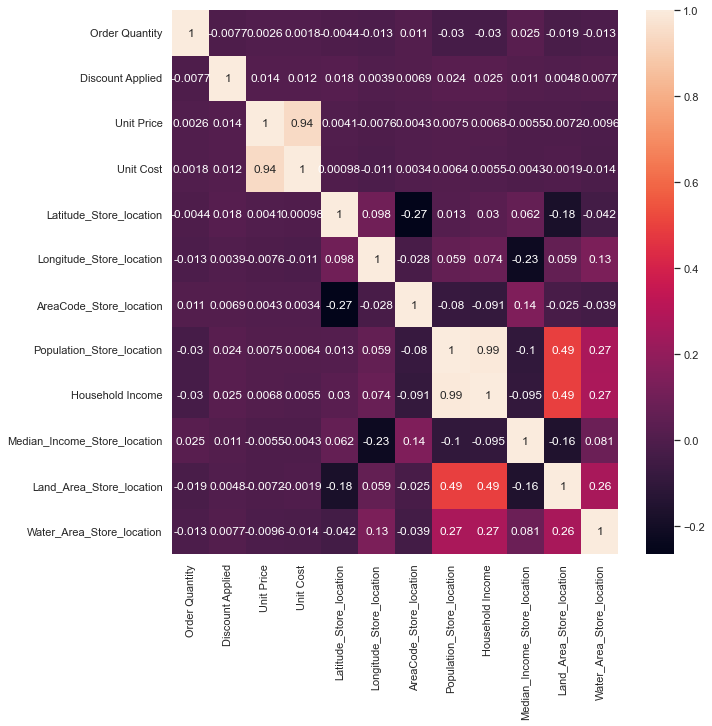

In [71]:
corr.figure

# Scatterplots:

In [72]:
# Create a scatterplot for the "house age" and "price per unit" columns in seaborn

sns.lmplot(x = 'Household Income', y = 'Population_Store_location', data = df_merged_5)

We can observe that the larger the population, the larger is the household income as well.

# Pair Plots:

In [73]:
# Keep only the variables you want to use in the pair plot

sub_2 = df_merged_5[['Household Income', 'Population_Store_location', 'Median_Income_Store_location', 'Land_Area_Store_location']]

In [74]:
# Create a pair plot 

g = sns.pairplot(sub_2)

# Categorical Plots:

In [75]:
# Use a histogram to visualize the distribution of the variables. This way, you can determine sensible categories for the price ranges. You don't want to end up with too few observations in any one of the categories.
sns.histplot(df_merged_5['Population_Store_location'], bins =100)


<AxesSubplot:xlabel='Land_Area_Store_location', ylabel='Count'>

In [76]:
# Check version of matplotlib
matplotlib.__version__

'3.4.2'

In [77]:
# Ensure charts are displayed in the notebook
%matplotlib inline

In [78]:
df_merged_5['Population_Store_location'].max()

8550405

In [79]:
df_merged_5['Population_Store_location'].min()

100242

In [80]:
df_merged_5['Population_Store_location'].mean()

293563.3117256914

In [81]:
df_merged_5.loc[df_merged_5['Population_Store_location'] < 293563, 'population_type'] = 'Low_population'

In [82]:
df_merged_5.loc[df_merged_5['Population_Store_location'] > 293563, 'population_type'] = 'High_population'

In [83]:
df_merged_5['population_type'].value_counts(dropna = False)

Low_population     6396
High_population    1595
Name: population_type, dtype: int64

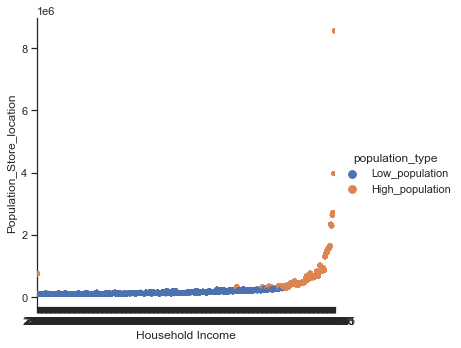

In [84]:
# Create a categorical plot in seaborn using the price categories created above

sns.set(style="ticks")
g = sns.catplot(x="Household Income", y="Population_Store_location", hue="population_type", data=df_merged_5)

# Questions to be answered

Sales are stronger in bigger populations?

Which products are being sold in biggest / lowest populations?

Is any relation between discount offered and increase of sales? why not if not

Which are the sales team with the best performance?

In which states we are selling most expensive products?

Which states are showing an increase / decrease in sales ?

Which products are increasing the costs and where?

Explore sales in relation to Household Income and population

Explore sales by customers and geography

In [85]:
# EXPORTING DATA
df_merged_5.to_pickle(os.path.join(path, '02- Data','Prepared Data', 'DF_clean.pkl'))